In [1]:
import os
import re
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import unicodecsv as csv
import seaborn as sns
from cycler import cycler
from textwrap import wrap
from IPython.display import display, HTML, Markdown

# Analysize variables.

In [2]:
# Read documentation.
columns_file = r"../records_documentation.txt"

with open(columns_file,"r") as f:
    columns = f.readlines()
columns
        

['[Column 0] ID\n',
 '[Column 1] Birth year: deduced from education history, where available\n',
 '[Column 2] Gender flag: 1=female, 2=male, 0=unknown\n',
 '[Column 3] Skillset1: primary skillset deduced from self-reported skills\n',
 '[Column 4] Skillset1 weight: the extent to which primary skillset is representative of overall self-reported skills\n',
 '[Column 5] Skillset2: secondary skillset deduced from self-reported skills\n',
 '[Column 6] Skillset2 weight: the extent to which secondary skillset is representative of overall self-reported skills\n',
 '[Column 7] City of profile (does not change): where unavailable, the field is left blank\n',
 '[Column 8] Country of Profile (does not change)\n',
 '[Column 9] Education (highest degree attained): 0=none/unknown; 1=high school; 2=vocational degree; 3=associateÕs; 4=bachelorÕs; 5=masterÕs other than MBA; 6=MBA; 7=doctorate (PhD/JD/MD) [NB: Romanian names not covered]\n',
 "[Column 10] Elite institution: a flag indicating whether any o

So:
- Unique identifier: ID.
- Variable Groups:
    - Column 0-10, profile info; 
    - Column 11-28, employment or education info; (c26 = False or True)
        - Column 11-18, general info;
        - Column 19-25, company info;
        - Column 27-28, school info.

In [3]:
# Define an iterator for reading rows.
def rows_iter(index=True):
    if index:
        for index, (line, ticker) in enumerate(rows_iter(index=False)):
             yield index, line, ticker
    else:
        empl_path = r"../tech/"
        empl_file_lst = os.listdir(empl_path)
        for empl_file_name in empl_file_lst:
            empl_file = empl_path+empl_file_name
            ticker = empl_file_name[:-4].upper()
            with open(empl_file,"rb") as f:
                reader = csv.reader(f,encoding='utf-8',escapechar='',delimiter='\t')
                for line in reader:
                    del line[1]
                    yield line, ticker

In [4]:
# Get unique values for each variable.
unique_values = []
for i in range(33):
    unique_values.append(set())
# Get unique values for each variable.
for idx, line, ticker in rows_iter():
    for i in range(33):
        unique_values[i].add(line[i])
for idx, values in enumerate(unique_values):
    print("[Column {}] ".format(idx)+str(len(values)))

[Column 0] 1014069
[Column 1] 84
[Column 2] 3
[Column 3] 45
[Column 4] 350227
[Column 5] 45
[Column 6] 350226
[Column 7] 17048
[Column 8] 233
[Column 9] 8
[Column 10] 2
[Column 11] 999
[Column 12] 3
[Column 13] 874
[Column 14] 3
[Column 15] 2
[Column 16] 4677
[Column 17] 2605598
[Column 18] 895
[Column 19] 1630789
[Column 20] 1427895
[Column 21] 9015
[Column 22] 277
[Column 23] 2
[Column 24] 229496
[Column 25] 712
[Column 26] 2
[Column 27] 8
[Column 28] 2
[Column 29] 1445
[Column 30] 80
[Column 31] 6748
[Column 32] 982771


In [5]:
# One block to convert data to pd.DataFrame.
entries_lst = []
for idx, line, ticker in rows_iter():
    if idx == 20: # Control number of rows.
        break
    entries_lst.append([ticker]+line)

samples_lst = entries_lst
entries_df = pd.DataFrame(data=entries_lst)
entries_df.loc[:,[18,19]]


,18,19
0,"from Private to Colonel,private",
1,"""Bachelor of Science (BS), Leadership Studies""...",
2,"""Master of Military Arts and Science, Organiza...",
3,"""Masters of Military Art and Science, Operatio...",
4,"Joint Plans Officer (Lieutenant Colonel),offic...",
5,Chief Executive Leader | Battalion Commander (...,OVERSIGHT
6,Chief Operating Officer | Chief of Staff (Lieu...,"OPERATIONS,OVERSIGHT"
7,"""Master of Military Art and Science, Strategic...",
8,"Academic Fellow (Colonel),fellow",
9,Senior Director Information Operations (Colone...,"OPERATIONS,OVERSIGHT"


In [6]:
# Get an example.
entry = samples_lst[3]
for i in range(len(entry)):
    print("[Column {}] ".format(i)+entry[i])

[Column 0] AMZN
[Column 1] d535c239-6f3f-3368-8179-34cdb5c6614b
[Column 2] 1936
[Column 3] 2
[Column 4] -1
[Column 5] 0
[Column 6] -1
[Column 7] 0
[Column 8] 
[Column 9] United States
[Column 10] 5
[Column 11] False
[Column 12] 2000-01-01
[Column 13] False
[Column 14] 2001-01-01
[Column 15] False
[Column 16] False
[Column 17] 366
[Column 18] "Masters of Military Art and Science, Operational Planning",Masters of Military Art and Science,Operational Planning
[Column 19] 
[Column 20] School of Advanced Military Studies
[Column 21] School of Advanced Military Studies
[Column 22] 
[Column 23] UNITED STATES
[Column 24] False
[Column 25] 
[Column 26] 
[Column 27] True
[Column 28] 
[Column 29] False
[Column 30] 
[Column 31] 
[Column 32] 
[Column 33] 1538410838988


# Aggregate employment changes to the firm-by-date level.

Definition of employment change types: When only employment records are considered, an employment change will be recognized as
- `hiring` if it changed its company to one of the two companies (Deloitte and PwC, hereafter);
- `firing` if it changed its company from one of the two companies to `TIME_OFF` and stayed in `TIME_OFF` for more than 100 days;
- `leaving` if it changed its company from one of the two companies and not recogized as `firing`.

In [7]:
# Define a class to read and process entries.
class entryProcessor:    
    
    def __init__(self, person_id, ticker=None):
        self.person_id = person_id
        self.profile = [None]*7 # "birth_year","gender","skill1","skill2","country","education_level","f_elite"
        self.employment = [None]*7 # "start_date","end_date","ticker","f_current","job_role","department", "nth_posit"
        self.ticker = ticker
        
    # Three functions to output records.
    # Varlist: Hiring/Leaving/Firing, Ticker, year-month, profile_info: [...], next_industry.
    def enter_record(self):
        return ['hiring',self.employment[2],self.employment[0]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+['',''] 
    def leave_record(self,next_industry):
        return ['leaving',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+[next_industry]+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                                 self.employment[6]]
    def fired_record(self):
        return ['firing',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                      self.employment[6]]
    
    # When id changes, record a possible leave and then clear contents.
    def reinitialize(self,entry):
        if self.employment[3]=="False":
            record = self.leave_record('')
        else:
            record = None
        self.__init__(entry[0],self.ticker)
        self.profile = [entry[x] for x in [1,2,3,5,8,9,10]]
        if entry[6] is not None:
            self.profile[3] = '' if float(entry[6])<0.1 else entry[5]
        return record
    
    # Main method: read and process.
    def read(self,entry,ticker):
        record = []
        self.ticker = ticker
        # Reinitialize when id changes.
        if self.person_id != entry[0]:
            leave_last = self.reinitialize(entry)
            if leave_last is not None:
                record.append(leave_last)
        # Then deal with the current entry.
        if entry[3] != "-1" and entry[26] == "False":
            if self.employment[2] != entry[21]:
                if self.employment[2] == self.ticker:
                    if entry[25] == "TIME_OFF" and int(entry[16]) > 100:
                        record.append(self.fired_record())
                    else:
                        record.append(self.leave_record(entry[25]))
                self.employment = [None]*7
                if entry[21] == self.ticker:
                    self.employment[0] = entryProcessor.convert_time(entry[11],entry[12])
                    self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                    self.employment[2] = entry[21]
                    self.employment[3] = entry[15]
                    self.employment[4] = entry[17]
                    self.employment[5] = entry[18]
                    self.employment[6] = 0
                    record.append(self.enter_record())
            else:
                self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                self.employment[3] = entry[15]
                self.employment[6] += 1
        return record
            
    # Unbound methods.
    def convert_time(date,f_valid_month):
        date_regex = re.match(r"(\d{4})-(\d{2})-\d{2}",date)
        if date_regex is None:
            return None
            #raise ValueError('Not a proper date: {}'.format(date))
        else:
            return date_regex.group(1)+('00' if f_valid_month == 'False' else date_regex.group(2))
    
    def time_diff(end_date,start_date):
        if end_date is not None and start_date is not None:
            edt, sdt = int(end_date), int(start_date)
            yr_diff = edt//100-sdt//100
            emth = edt%100
            smth = sdt%100
            if not yr_diff and not (emth and smth):
                return min(6,(emth-smth-1)%12+1)
            else:
                return yr_diff*12+(emth if emth else 6)-(smth if smth else 6)
        else:
            return np.nan
        
    # For print.
    def __str__(self):
        return "[person_id: {}, profile: {}, employment: {}]".format(self.person_id, self.profile, self.employment)
            
#entry = entryProcessor(None)
#for i in range(50):
#    print(i)
#    print(entry.read(samples_lst[i]))
#    print(entry)

In [8]:
# Read, Identify & Aggregate.

## Initialize.
career = entryProcessor(None)

## Iterate.
empl_changes_lst = []
for idx, entry, ticker in itertools.chain(rows_iter(),[(None,[None]*33,"")]):
    if idx == np.inf: # End point.
        break
    #ticker = {"BAC":"BAC","CITI":"C","GS":"GS","JPM":"JPM","MS":"MS","WFC":"WFC","":None}[ticker]
    empl_change_this = career.read(entry, ticker)
    if empl_change_this != []:
        empl_changes_lst += empl_change_this

varlist = [
    "type","ticker","yrmth","birth","gender","skill1","skill2","cntry","edu","f_elite",
    "job_role","depmt","ind_next","tenure","nprom"
]
empl_changes_df = pd.DataFrame(data=empl_changes_lst,columns=varlist)
empl_changes_df


,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom
0,hiring,AMZN,201510,1984,1,Electrical Engineering,Public Policy,Italy,5,False,"FC Problem Solver /backup supervisor,financial...",,,,
1,leaving,AMZN,201707,1984,1,Electrical Engineering,Public Policy,Italy,5,False,"FC Problem Solver /backup supervisor,financial...",,,21,2
2,hiring,AMZN,201409,1965,1,Administration,Logistics,United States,1,False,"Fulfillment Associate,associate",,,,
3,leaving,AMZN,201411,1965,1,Administration,Logistics,United States,1,False,"Fulfillment Associate,associate",,,2,0
4,hiring,AMZN,201510,1989,2,Human Resources (Junior),Administration,Ireland,4,False,"Customer Service Representative,customer servi...",MARKETING,,,
5,leaving,AMZN,201601,1989,2,Human Resources (Junior),Administration,Ireland,4,False,"Customer Service Representative,customer servi...",MARKETING,,3,0
6,hiring,AMZN,200907,1977,1,Social Media and Communications,Business Development,United States,0,False,"Marketing Communications Specialist,marketing,...","MARKETING,MANAGEMENT",,,
7,leaving,AMZN,201401,1977,1,Social Media and Communications,Business Development,United States,0,False,"Marketing Communications Specialist,marketing,...","MARKETING,MANAGEMENT",,54,0
8,hiring,AMZN,201706,1971,1,Software Engineering,IT Management and Support,United States,4,False,"Software Engineer,software engineer",TECHNOLOGY,,,
9,hiring,AMZN,201409,1974,2,Middle Management,CRM and Sales Management,United States,4,False,"Senior Manager Sales Operations,senior manager...","OPERATIONS,MARKETING",,,


# Summarize and plot.

**For all positions in:**
- **AMZN**: Amazon.
- **GOOG**: Google.
- **IBM**: IBM.
- **MSFT**: Microsoft.

In [9]:
# Colors.
color_styles = ['g','r','c','m','y']
line_styles = ['-','--','-']
marker_styles = ['o','^','^']

In [10]:
# Deal with 'yrmth'.
empl_changes_df = empl_changes_df.assign(
    year = lambda df:df.yrmth.apply(lambda x:int(x[:4]) if x is not None else np.nan),
    month = lambda df:df.yrmth.apply(lambda x:int(x[4:]) if x is not None else -1)
)

empl_changes_df.describe(include=[np.object])

,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom
count,684834,684834,658255,684834,684834,684834,684834,684834,684834,684834,684834,684834,684834,669358,684834
unique,3,4,841,84,3,44,45,209,8,2,180357,425,548,554,22
top,hiring,IBM,201506,2000,2,Software Engineering,,United States,4,False,"Software Engineer,software engineer",,,,
freq,408623,353085,6124,114367,345058,78515,157884,275750,304605,631650,14941,320643,522585,408623,408623


## Count the number of employees from Dec., 1989 on.

Note: 
- This block counts the number of currently employed accountants for the two firms by calculating the cumulative sums of the net employment increase, that is, hiring minus the sum of firing and leaving.
- This method is not effective for the early years. However, if we can assure that we have all the resumes of accountants after some time, we will have the correct number after all the accountants employed before that time have left the company. We assume that the number is correct after 1989 except the most recent years.
- All the numbers are counted in the end of the year and will be used to calculate the proportion of the employment changes for next year. Note that we do not calculate monthly employment separately since there are a good proportion of our data with invalid months.

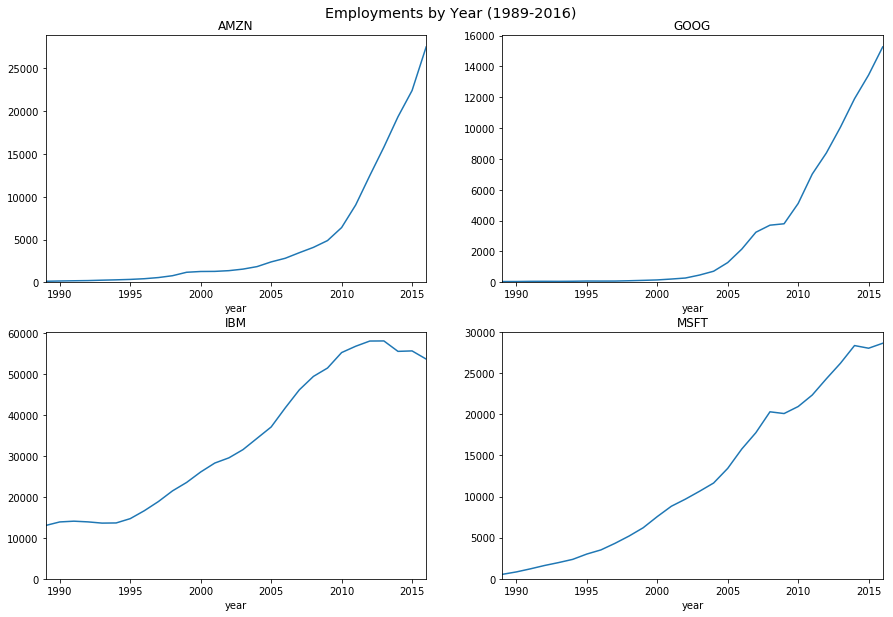

In [11]:
count_by_years = pd.DataFrame({'count':empl_changes_df.groupby(['ticker','type','year']).size()}).reset_index()
empl_by_years = count_by_years.groupby(['ticker','type']).apply(
    lambda df:df.sort_values(['year']).assign(cumsum = lambda df2:df2['count'].cumsum()) # Calculate cumsum.
).reset_index(drop=True).pivot_table(
    index=['ticker','year'],columns='type',values=['cumsum'],fill_value=0 # Reshape to wide format.
).assign(
    employment=lambda df:(df['cumsum']['hiring']-df['cumsum']['firing']-df['cumsum']['leaving']) # Get employment.
).drop('cumsum',axis=1).reset_index()
empl_by_years.columns = empl_by_years.columns.droplevel('type')

# Plot.
fig, axs = plt.subplots(2,2,figsize=(15,10))
fig.suptitle("Employments by Year (1989-2016)", fontsize="x-large",y=0.92)
for (ticker, col), ax in zip(
    empl_by_years.pivot_table(
        index='year',columns='ticker',values='employment',fill_value=0
    ).loc[lambda df:(df.index>=1989)&(df.index<=2016)].iteritems(),
    itertools.chain.from_iterable(axs)
):
    col.plot(ax=ax, title=ticker).set_ylim(bottom=0)
plt.show()

## Overall trends.
Note: Plots by year and plots by months do not only differ in frequency, but also in sample size. This is due to the entries without valid month record.

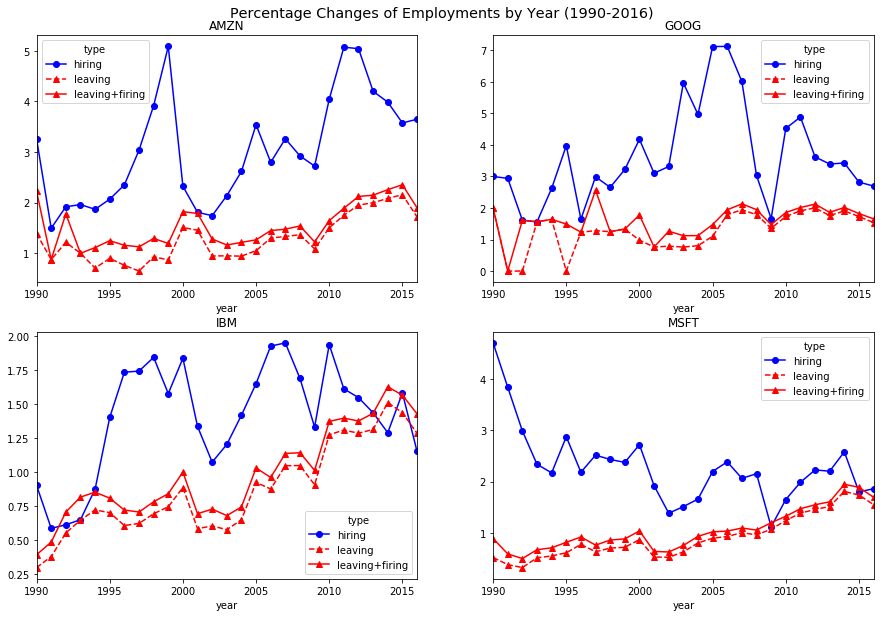

In [12]:
# Count and calculate percentages of employment changes.
prop_by_months = pd.DataFrame(
    {'count':empl_changes_df.groupby(['ticker','type','year','month']).size()} # Count by month.
).reset_index().merge(
    right=empl_by_years.assign(year_1L=lambda df:df.year+1)[['ticker','year_1L','employment']],
    left_on = ['ticker','year'], right_on = ['ticker','year_1L'] # Merge with last year's employment.
).assign(
    prop=lambda df:df['count']/df['employment']*100 # Calculate proportions.
).drop(
    ['count','year_1L','employment'],axis=1 # Drop unnecessary variables.
).loc[lambda df:(df.year>=1990)&(df.year<=2016)] # Keep only [1990, 2016] segment.

# Plot by year.
fig, axs = plt.subplots(2,2,figsize=(15,10))
fig.suptitle("Percentage Changes of Employments by Year (1990-2016)", fontsize="x-large",y=0.92)
for (ticker, grp), ax in zip(
    prop_by_months.pivot_table(
        index = ['ticker','year'], columns = 'type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{"leaving+firing":lambda df:df.leaving+df.firing}
    ).drop("firing",axis=1).groupby('ticker'),
    itertools.chain.from_iterable(axs)
):
    grp.drop('ticker',axis=1).loc[lambda df:df.year>=1990].set_index('year').plot(
        ax=ax, title=ticker, xticks=[1990,1995,2000,2005,2010,2015], xlim=(1990,2016), style=['b-o','r--^','r-^']
    )
plt.show()

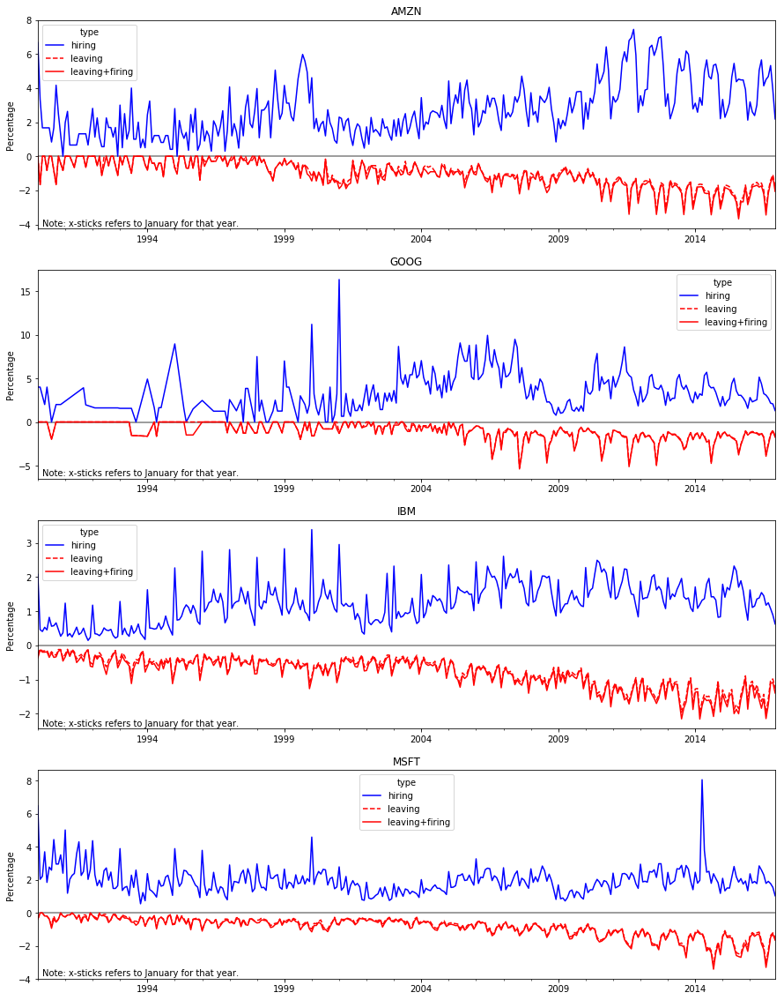

In [13]:
start_year=1990
end_year=2016
fig, axs = plt.subplots(4,1,figsize=(15,20))
for (ticker, grp),ax in zip(
    prop_by_months.loc[lambda df:(df.month!=0)&(df.year>=start_year)&(df.year<=end_year)].pivot_table(
        index = ['ticker','year','month'], columns='type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{
            "leaving+firing":lambda df:-(df.leaving+df.firing),
            "leaving":lambda df:-df.leaving,
            "yrmth":lambda df:pd.PeriodIndex(year=df.year,month=df.month,freq='M')
        }
    ).set_index('yrmth').groupby('ticker'),
    axs
):
    grp.loc[lambda df:df.year>=1990][['hiring','leaving','leaving+firing']].plot(
        ax=ax,title=ticker,style=['b-','r--','r-'],
        xlim=(pd.Period('{}-01'.format(1990)),pd.Period('{}-12'.format(2016))),
        #xticks=[pd.Period('{}-01'.format(int(x*5+1990))) for x in range(5)]
    )
    ax.set_ylabel('Percentage')
    ax.set_xlabel('')
    ax.hlines(0,pd.Period('{}-01'.format(1990)),pd.Period('{}-12'.format(2016)),colors='tab:gray')
    ax.annotate("Note: x-sticks refers to January for that year.",(5,3),xycoords="axes points")
plt.show()

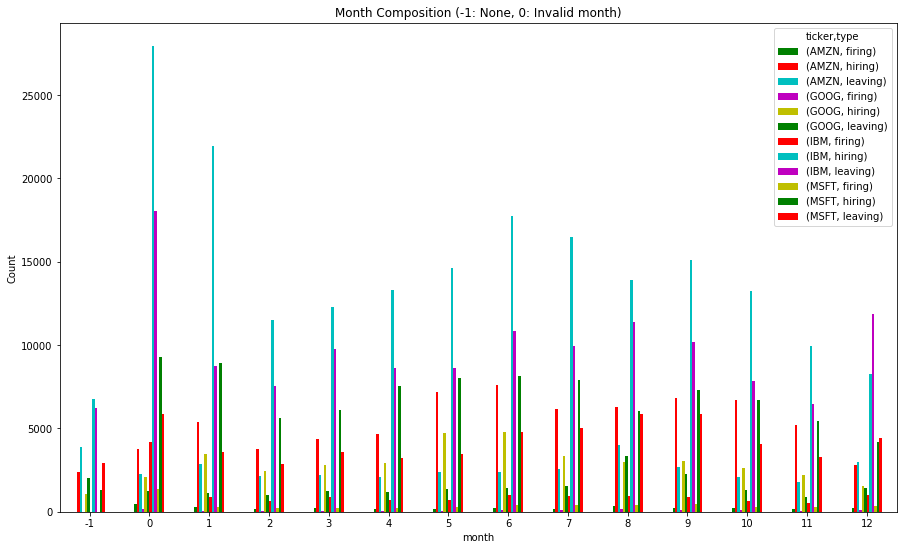

In [14]:
# Month composition.
empl_changes_df.assign(count=1).pivot_table(
    index = 'month', columns = ['ticker','type'], values='count', aggfunc='sum', fill_value=0
).plot.bar(
    figsize=(15,9),color=color_styles,rot=0,
    title="Month Composition (-1: None, 0: Invalid month)"
).set_ylabel("Count")
plt.show()

## By birth group.
Note: Birth year `2000` seems to be a trash bin for problematic records and thus will be treated the same as `None`.

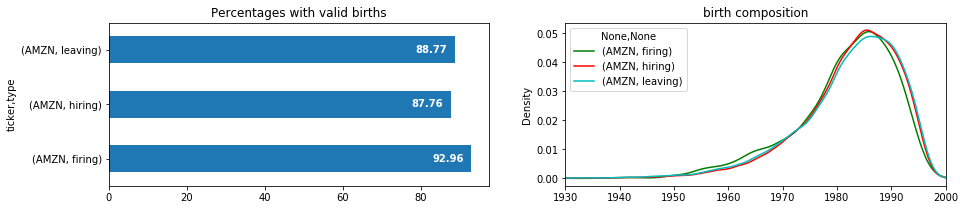

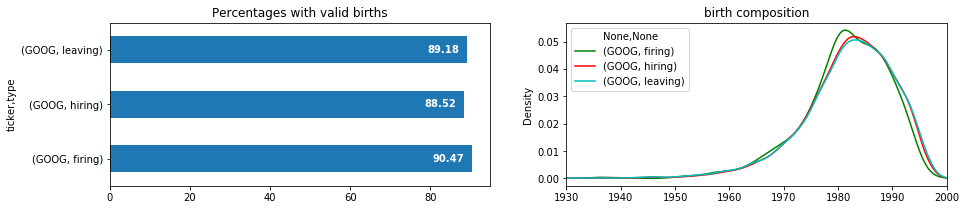

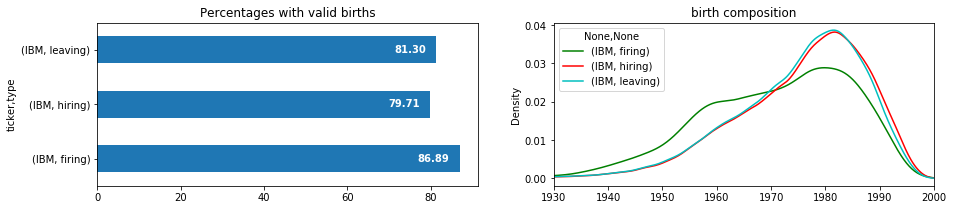

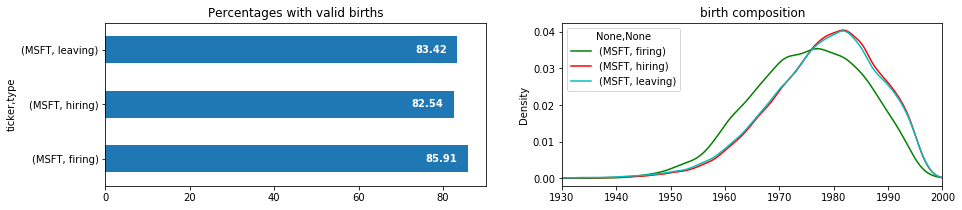

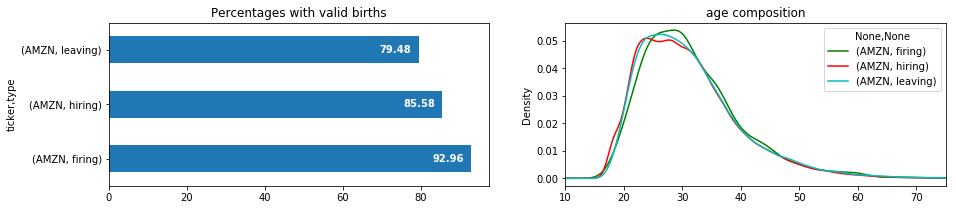

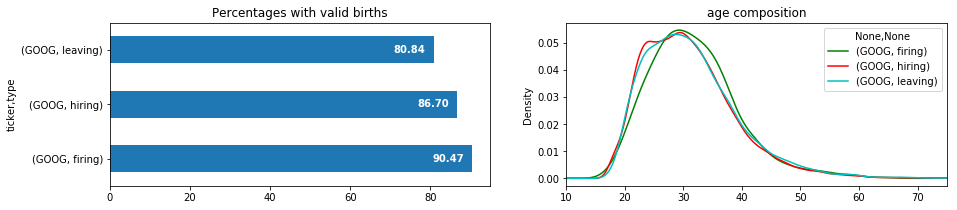

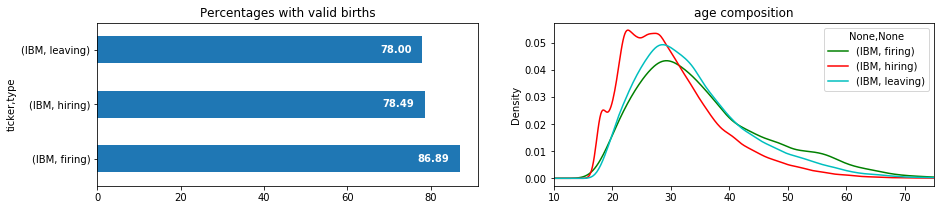

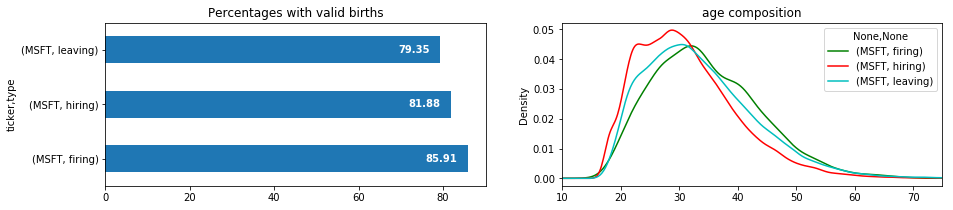

In [15]:
birth_df = empl_changes_df[['ticker','type','year','birth']]
birth_df = birth_df.assign(
    birth = lambda df:df.birth.apply(lambda x:int(x) if x not in ['2000','None'] else np.nan),
    age = lambda df:(df.year-df.birth)
)

# Define a routine to generate plots.
var, xlim = "birth", (1930,2000)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()
var, xlim = "age", (10,75)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()

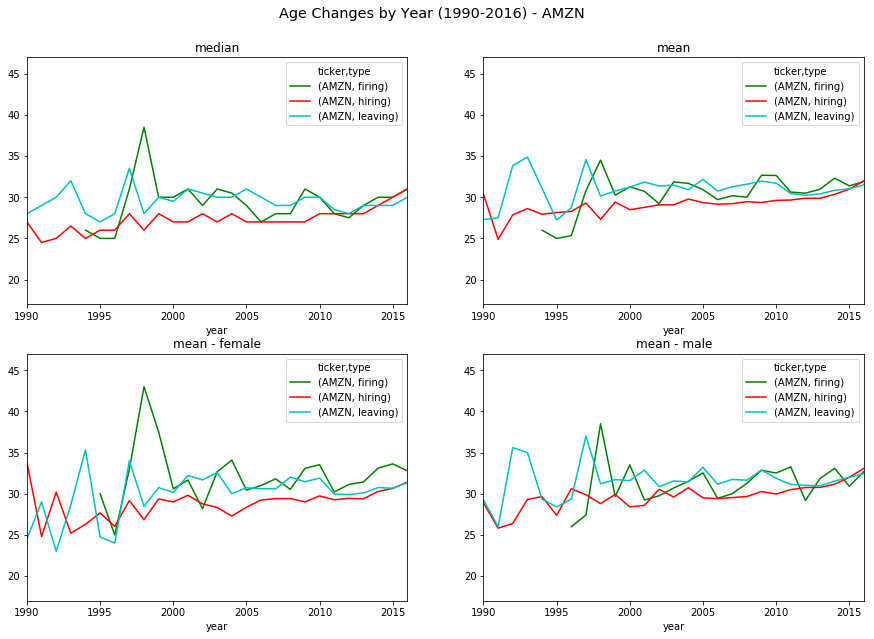

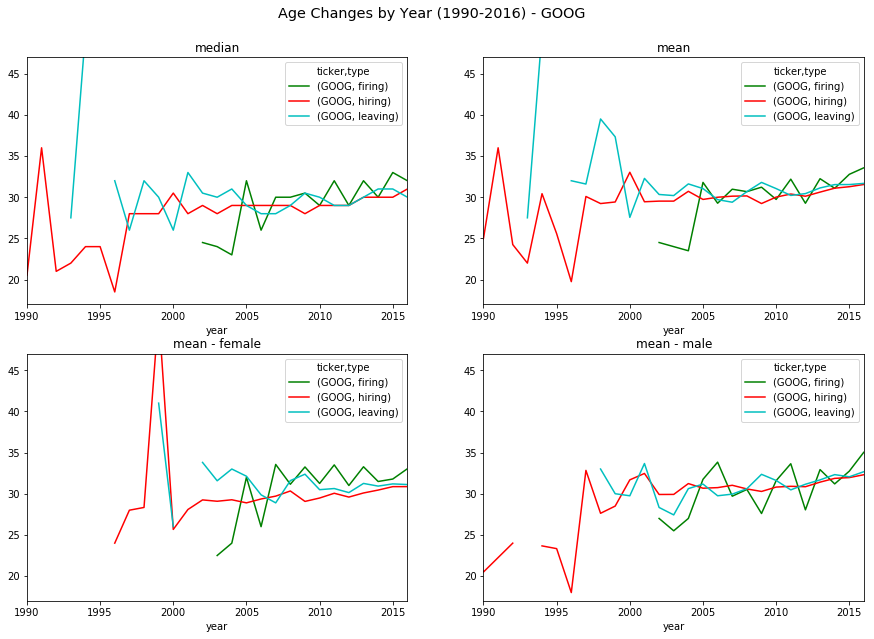

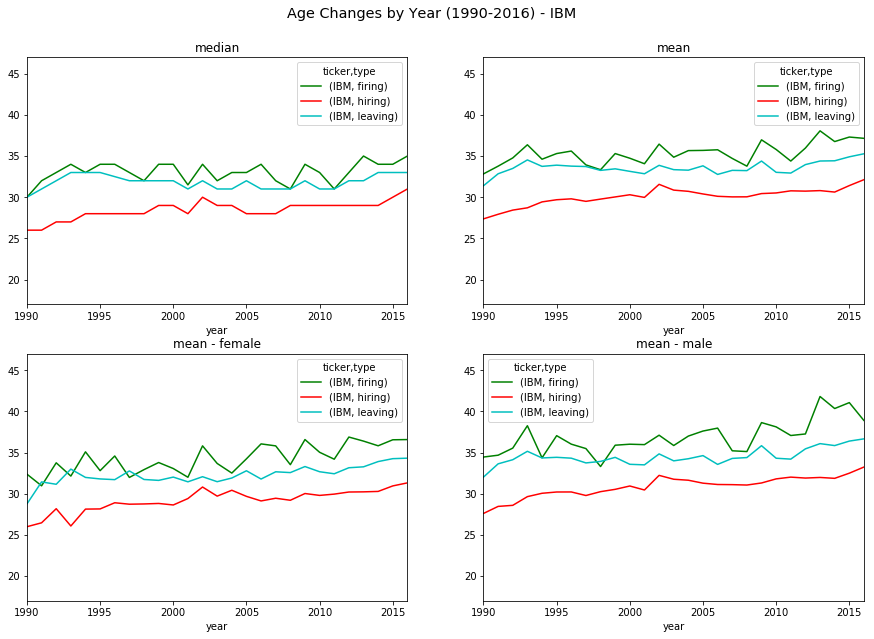

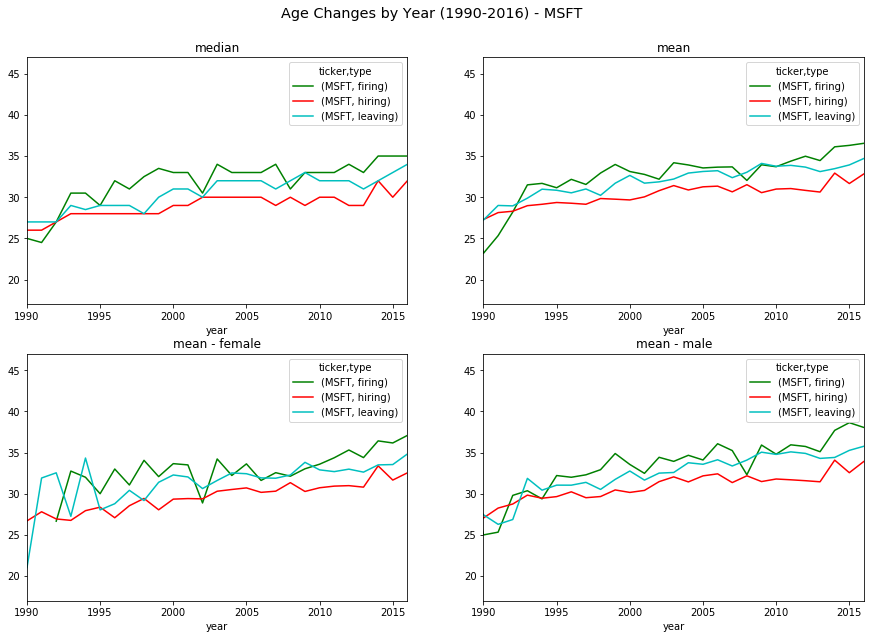

In [16]:
# Age changes by year.
for (ticker, grp) in birth_df.groupby('ticker'):
    fig, ((ax11, ax12), (ax21, ax22))=plt.subplots(2,2,figsize=(15,10))
    fig.suptitle('Age Changes by Year (1990-2016) - {}'.format(ticker),fontsize='x-large',y=0.95)
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='median'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax11,title='median')
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax12,title='mean')
    grp.loc[empl_changes_df.gender=='1'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax21,title='mean - female')
    grp.loc[empl_changes_df.gender=='2'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax22,title='mean - male')
    plt.show()

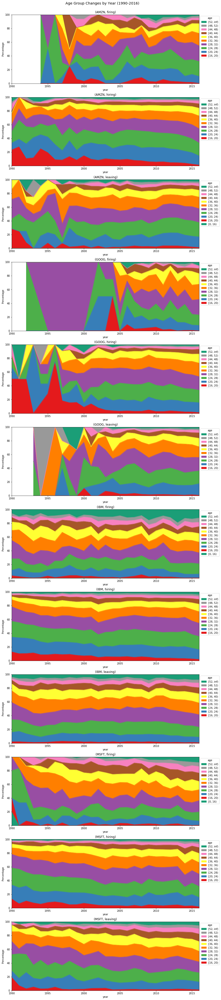

In [17]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Age Group Changes by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','age']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=pd.cut(grp.age, bins, right=False, labels=False), values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""),xlim=(1990,2016),
        color=[colormap_unif[int(float(i))] for i in to_plot.columns],
        xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title='age'
    )
plt.show()

## By Gender.

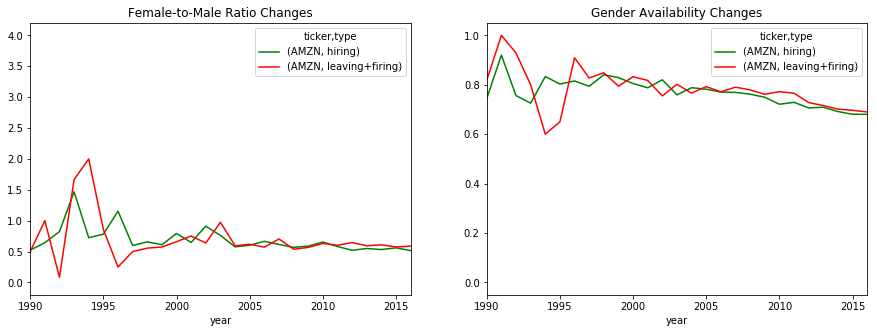

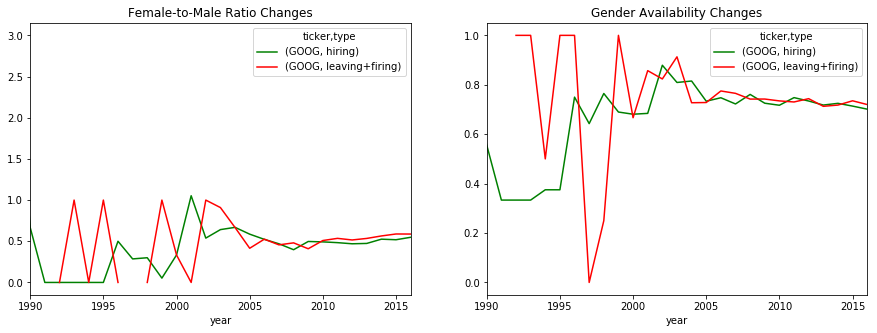

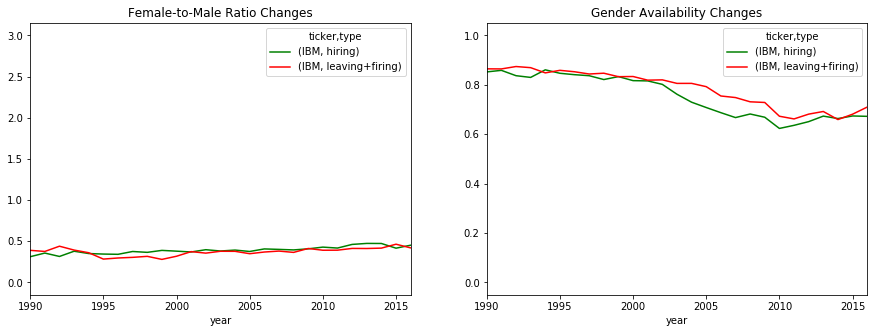

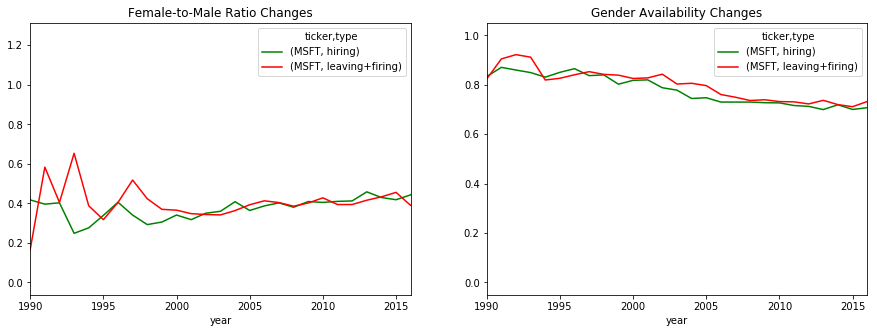

In [18]:
for ticker, grp in empl_changes_df.replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
).groupby('ticker'):
    fig, (ax1, ax2)=plt.subplots(1,2,figsize=(15,5))
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x=='1').sum()/(x=='2').sum() if (x=='2').sum() else np.nan)
    ).plot(
        xlim=(1990,2016),color=color_styles,title="Female-to-Male Ratio Changes",ax=ax1,
        xticks=[1990+5*x for x in range(6)]
    )
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x!='0').sum()/x.size)
    ).plot(
        xlim=(1990,2016),color=color_styles,title="Gender Availability Changes",ax=ax2,
        xticks=[1990+5*x for x in range(6)]
    )
    plt.show()

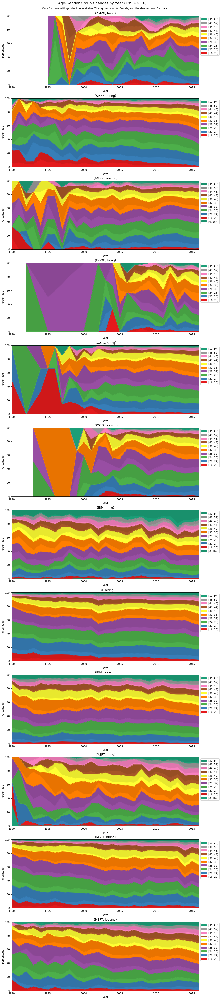

In [19]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Age-Gender Group Changes by Year (1990-2016)", fontsize='x-large', y=0.891)
fig.text(0.25,0.885,
         "Only for those with gender info available. The lighter color for female, and the deeper color for male.")
for (idx, grp), ax in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(empl_changes_df.gender!='0'), ['ticker','type','year','age']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=[pd.cut(grp.age, bins, right=False, labels=False), empl_changes_df.gender], 
        values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990+5*x for x in range(6)],
        color=[
            colormap_unif[int(float(i))] if j=='1' else tuple(t/1.1 for t in colormap_unif[int(float(i))]) 
            for i,j in to_plot.columns
        ]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed([handles[i] for i in range(len(handles)) if i%2==0]), 
        reversed(["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in
            [re.match(r"\((\d+)\.0",labels[i]).group(1) for i in range(len(labels)) if i%2==0]
        ]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Primary Skill.

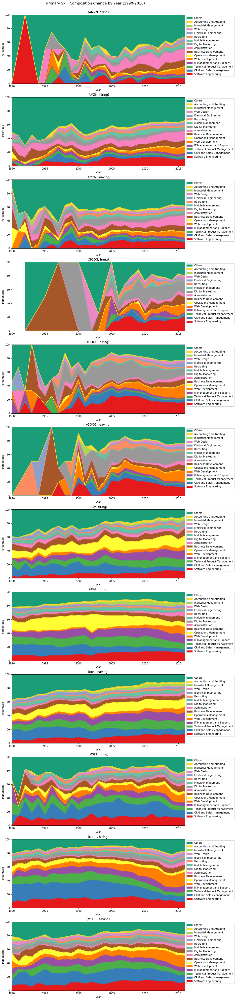

In [20]:
# Create a uniform colormap for all subplots.
skill1_ord_unif = empl_changes_df.groupby('skill1').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill1_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     empl_changes_df.loc[:].pivot_table(
#         index='skill1',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(12.5,72))
fig.suptitle("Primary Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill1']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        skill1_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill1_ord_unif)}[x] for x in df.skill1
        ], count = 1
    ).pivot_table(
        index='year', columns='skill1_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill1_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [21]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill1_ord_unif[i]+"</strong>"))
    to_plot = empl_changes_df.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill1==skill1_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30)
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,prop,depmt,prop,edu,prop
0,Software Engineer,12.50,Technology,81.44,Bachelors,45.20
1,Software,6.31,Marketing,6.09,Masters excl. MBA,26.47
2,Intern,4.21,Production,4.41,None/Unknown,16.61
3,Development Engineer,3.66,Operations,1.89,Doctorate (PhD/JD/MD),7.60
4,Senior Software Engineer,2.81,Business,1.80,MBA,2.33
5,Software Developer,2.32,Oversight,1.70,High school,1.16
6,Senior,1.96,Hr,1.07,Associates,0.38
7,It Specialist,1.84,Tehnology,0.82,Vocational degree,0.24
8,Test,1.79,Legal,0.58,NaN,NaN
9,Engineer,1.78,Accounting,0.15,NaN,NaN


,job_role,depmt,edu,f_elite
498336,Unix Support and Software / Web Application Te...,"HR,MARKETING,TECHNOLOGY",Masters excl. MBA,False
552188,"Software Development Engineer,development engi...",TECHNOLOGY,Masters excl. MBA,False
462262,"Senior Application Developer,senior,developer",,Bachelors,False
548453,"Intern at Search Technology Center Asia,intern",TECHNOLOGY,Bachelors,False
11642,"Software Development Engineer,development engi...",TECHNOLOGY,High school,False
69762,"Software Development Engineer Intern,developme...",TECHNOLOGY,Doctorate (PhD/JD/MD),False
87295,"Software Developer,software developer",TECHNOLOGY,Masters excl. MBA,False
510642,"Application Developer,developer",,Bachelors,False
450711,"Senior Software Developer,software developer,s...",TECHNOLOGY,Bachelors,False
184722,"Staff Engineer,staff engineer",,Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,"""",5.87,Marketing,42.45,Bachelors,39.98
1,Account Manager,3.39,Technology,14.77,None/Unknown,23.90
2,Sales,2.60,Business,14.41,MBA,17.27
3,Manager,2.58,Oversight,12.64,Masters excl. MBA,14.18
4,Senior,1.76,Hr,5.72,Doctorate (PhD/JD/MD),2.21
5,Sales Manager,1.58,Operations,4.63,High school,1.39
6,Partner,1.48,Accounting,2.18,Vocational degree,0.61
7,Software,1.47,Legal,1.12,Associates,0.45
8,Sales Specialist,1.46,Management,1.11,NaN,NaN
9,Business,1.44,Production,0.92,NaN,NaN


,job_role,depmt,edu,f_elite
652729,"EMEA Sales Lead - Windows,"","",sales,lead",MARKETING,None/Unknown,False
480098,"Client Relationship Manager,relationship manag...",,Bachelors,False
422885,"Power Systems Brand Sales Specialist,sales spe...","MARKETING,TECHNOLOGY",MBA,True
262441,"Sales and Marketing Trainee,sales and marketin...",MARKETING,Bachelors,False
208995,"Project Manager & Department Manager,project m...",,Bachelors,False
474854,"Head - Business Partner Operations,head,busine...","OPERATIONS,OVERSIGHT",MBA,False
680346,"Corporate Account Executive - Central Texas,ac...",BUSINESS,Bachelors,False
571898,"Business School Consultant,business,school,con...",,MBA,False
272066,"Watson Development Integration Executive,devel...",TECHNOLOGY,Bachelors,False
482487,"Senior Consultant,senior consultant",,None/Unknown,False


,job_role,prop,depmt,prop,edu,prop
0,Consultant,5.34,Technology,49.55,Bachelors,44.48
1,Senior,3.43,Marketing,17.13,None/Unknown,25.78
2,It Specialist,2.96,Business,11.69,Masters excl. MBA,17.09
3,Architect,2.35,Operations,7.01,MBA,7.29
4,Project Manager,2.11,Hr,4.47,Doctorate (PhD/JD/MD),2.24
5,Software Engineer,2.03,Oversight,3.40,High school,1.84
6,"""",2.02,Accounting,2.61,Associates,0.73
7,Developer,1.93,Production,2.45,Vocational degree,0.56
8,Program Manager,1.80,Legal,1.16,NaN,NaN
9,Senior Consultant,1.75,Tehnology,0.26,NaN,NaN


,job_role,depmt,edu,f_elite
176644,"Advisory Engineer,engineer",,Masters excl. MBA,False
537177,"Student Worker; Legal,student worker,legal",LEGAL,Masters excl. MBA,False
165194,software engineer,TECHNOLOGY,None/Unknown,False
224914,Co-Op,,Bachelors,False
200581,"IT Specialist,it specialist",TECHNOLOGY,Bachelors,False
274810,"Oracle DBA,database administrator",,Masters excl. MBA,False
336199,"IT Manager,it manager",TECHNOLOGY,Masters excl. MBA,False
236456,"Application Developer,developer",,Masters excl. MBA,False
373952,SME,,None/Unknown,False
315408,"Analista de sistemas,analista de sistemas",,Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,It Specialist,4.22,Technology,38.56,Bachelors,40.53
1,Specialist,2.54,Marketing,34.97,None/Unknown,34.50
2,Support Engineer,2.35,Operations,12.41,Masters excl. MBA,10.98
3,Senior,2.33,Hr,4.58,High school,4.46
4,Support,2.12,Business,2.97,Associates,3.68
5,Engineer,2.04,Oversight,2.79,MBA,3.09
6,Consultant,1.64,Production,2.13,Vocational degree,1.65
7,It,1.59,Legal,0.74,Doctorate (PhD/JD/MD),1.11
8,System Administrator,1.58,Accounting,0.45,NaN,NaN
9,Technical,1.57,Tehnology,0.21,NaN,NaN


,job_role,depmt,edu,f_elite
575553,"Technical Solutions Professional,technical,pro...",BUSINESS,Bachelors,False
418609,"IT Delivery Specialist,it,delivery,specialist","OPERATIONS,TECHNOLOGY",Bachelors,False
242372,MF Hardware Config,PRODUCTION,None/Unknown,False
313056,"Test Case Creator,test,creator",,Bachelors,False
522744,"System Administrator ||,system administrator",,None/Unknown,False
500191,"Computer Technician,computer technician",,Associates,False
371837,"Application Maintenance & Support,maintenance,...","OPERATIONS,MARKETING",Bachelors,False
429936,"Administrador Senior,administrador,senior",,Bachelors,False
471656,"Team Lead,team lead",,Bachelors,False
508346,"Aprendiz na área de TI,aprendiz,it",,None/Unknown,False


,job_role,prop,depmt,prop,edu,prop
0,Software Engineer,9.00,Technology,72.71,Bachelors,54.16
1,Intern,6.71,Marketing,9.84,Masters excl. MBA,23.51
2,Software,5.45,Oversight,8.78,None/Unknown,15.02
3,Development Engineer,3.53,Business,2.30,Doctorate (PhD/JD/MD),2.81
4,Software Developer,2.85,Operations,2.17,MBA,1.69
5,Developer,2.48,Production,1.49,High school,1.66
6,Student,2.35,Hr,1.30,Associates,0.62
7,Partner,1.55,Legal,0.71,Vocational degree,0.53
8,Software Development Engineer,1.45,Accounting,0.36,NaN,NaN
9,Consultant,1.41,Tehnology,0.27,NaN,NaN


,job_role,depmt,edu,f_elite
248015,"Intern,intern",,Bachelors,False
339070,Dualer Student im Bereich Wirtschaftsinformati...,,Bachelors,False
69292,"Software Developer,software developer",TECHNOLOGY,Masters excl. MBA,True
598179,"Program Manager Intern,program manager,intern",,Bachelors,False
198292,"IT Specialist,it specialist",TECHNOLOGY,None/Unknown,False
591184,"Software Engineer Co-op,software engineer",TECHNOLOGY,Bachelors,True
546744,"Software Developer,software developer",TECHNOLOGY,Masters excl. MBA,False
617075,"Premier Field Engineer,field engineer",,Bachelors,False
541438,"Research Intern,research,intern",TECHNOLOGY,Doctorate (PhD/JD/MD),True
668913,"Product Advisor,advisor",,Bachelors,False


## By Secondary Skill.

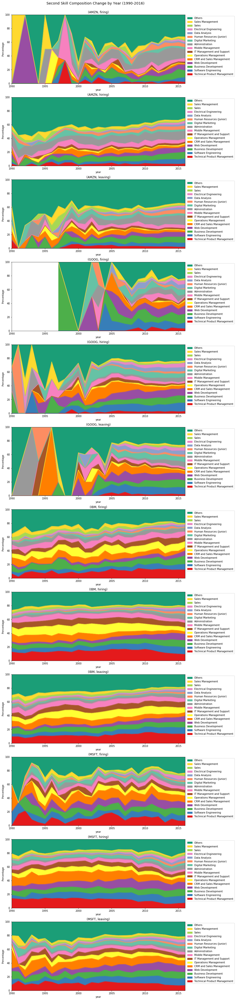

In [22]:
skill2_to_plot = empl_changes_df.loc[lambda df:df.skill2!='']

# Create a uniform colormap for all subplots.
skill2_ord_unif = skill2_to_plot.groupby('skill2').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill2_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     skill2_to_plot.loc[:].pivot_table(
#         index='skill2',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(12.5,72))
fig.suptitle("Second Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    skill2_to_plot.loc[lambda df:df.skill2!=''].loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill2']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        skill2_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill2_ord_unif)}[x] for x in df.skill2
        ], count = 1
    ).pivot_table(
        index='year', columns='skill2_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill2_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [23]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill2_ord_unif[i]+"</strong>"))
    to_plot = skill2_to_plot.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill2==skill2_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30).assign(
        job_role=lambda df:df.job_role.apply(lambda x:x.split(",")[0])
    )
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,prop,depmt,prop,edu,prop
0,Consultant,4.63,Technology,45.28,Bachelors,44.39
1,Senior,2.74,Marketing,20.27,None/Unknown,24.30
2,Project Manager,2.61,Operations,8.47,Masters excl. MBA,17.80
3,Software Engineer,2.60,Business,8.11,MBA,7.84
4,It Specialist,2.46,Hr,4.95,Doctorate (PhD/JD/MD),2.21
5,"""",2.35,Oversight,4.88,High school,1.88
6,Manager,1.65,Production,3.29,Associates,0.85
7,Program Manager,1.58,Accounting,2.78,Vocational degree,0.73
8,Architect,1.57,Legal,1.33,NaN,NaN
9,Software,1.53,Tehnology,0.36,NaN,NaN


,job_role,depmt,edu,f_elite
557778,Senior Architect & Consultant,,None/Unknown,False
409614,Solutions Architect,BUSINESS,Vocational degree,False
527769,Developer IBM Telco Management Network product,TECHNOLOGY,Bachelors,False
613951,Business Manager,,None/Unknown,False
302137,Chef de projet de traduction : gestion de proj...,,None/Unknown,False
199292,Analista de Teste,,Bachelors,False
611971,Service Executive,MARKETING,Bachelors,False
306064,Analytics Cognos Developer,BUSINESS,Bachelors,False
549329,PA to Sales Directors,MARKETING,High school,False
657353,Principal Research Software Design Engineer/ Lead,"MARKETING,TECHNOLOGY",Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,Software Engineer,8.49,Technology,74.25,Bachelors,46.97
1,Software,4.88,Marketing,9.87,Masters excl. MBA,23.61
2,Intern,4.67,Oversight,3.59,None/Unknown,17.57
3,Development Engineer,2.87,Operations,3.43,Doctorate (PhD/JD/MD),6.25
4,Software Developer,2.09,Business,3.02,MBA,3.27
5,It Specialist,2.01,Production,2.64,High school,1.44
6,Senior,1.96,Hr,1.88,Associates,0.52
7,Consultant,1.80,Legal,0.59,Vocational degree,0.37
8,"""",1.78,Accounting,0.34,NaN,NaN
9,Developer,1.73,Tehnology,0.31,NaN,NaN


,job_role,depmt,edu,f_elite
126004,Software Engineer,TECHNOLOGY,Bachelors,True
659728,Software Development Consultant,TECHNOLOGY,None/Unknown,False
374974,Residential secondment to IBM laboratories Aus...,OPERATIONS,None/Unknown,False
650259,Senior Applied Scientist,,Doctorate (PhD/JD/MD),False
158990,Intern,,Bachelors,False
278572,Software Engineer,TECHNOLOGY,Bachelors,False
115329,Software Engineering Intern,TECHNOLOGY,Bachelors,False
98325,Software Developer Intern,TECHNOLOGY,Bachelors,False
404905,Tivoli Specialist,,Bachelors,False
484294,Infrastructure engineer,,Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,"""",3.00,Marketing,39.16,Bachelors,40.08
1,Intern,2.35,Technology,16.96,Masters excl. MBA,21.93
2,Manager,1.53,Operations,9.70,None/Unknown,18.98
3,Specialist,1.34,Business,9.50,MBA,12.27
4,Consultant,1.33,Oversight,8.13,High school,2.53
5,Associate,1.24,Hr,6.00,Doctorate (PhD/JD/MD),2.10
6,Marketing Manager,1.16,Accounting,5.49,Vocational degree,1.13
7,Analyst,1.15,Production,1.98,Associates,0.97
8,Senior,1.14,Management,1.69,NaN,NaN
9,Account Manager,1.12,Legal,1.27,NaN,NaN


,job_role,depmt,edu,f_elite
347141,Analyste développeur,,None/Unknown,False
218541,Account Associate UKI market,BUSINESS,Masters excl. MBA,False
207549,Programmatore - Sistemista,,None/Unknown,False
197831,Project Office Coordinator,,Bachelors,False
152391,Process Manager,,High school,False
187587,Administrative Assistant,,None/Unknown,False
158637,Speech Data Evaluator (via Adecco),,Bachelors,False
95721,Product Manager Intern,,MBA,False
130032,Senior Data Specialist,,Masters excl. MBA,False
327228,INGENIEUR D’AFFAIRE E&C,,None/Unknown,False


,job_role,prop,depmt,prop,edu,prop
0,Software Engineer,9.39,Technology,73.19,Bachelors,48.17
1,Software,5.65,Marketing,12.11,Masters excl. MBA,26.03
2,Intern,4.91,Oversight,3.25,None/Unknown,15.94
3,Development Engineer,3.67,Business,2.97,Doctorate (PhD/JD/MD),4.43
4,Software Developer,2.46,Operations,2.93,MBA,2.50
5,Developer,1.95,Production,2.33,High school,1.79
6,Senior Software Engineer,1.80,Hr,1.47,Associates,0.64
7,Software Development Engineer,1.53,Legal,0.71,Vocational degree,0.50
8,Consultant,1.52,Tehnology,0.47,NaN,NaN
9,"""",1.49,Accounting,0.45,NaN,NaN


,job_role,depmt,edu,f_elite
483842,Senior Software Engineer,TECHNOLOGY,None/Unknown,False
315744,Software Engineer,TECHNOLOGY,Bachelors,False
568724,Principal Software Engineer,TECHNOLOGY,Bachelors,False
350453,Analista Funcional,,Bachelors,False
424710,Intern,,Bachelors,False
672114,Data & AI - Technical Solutions Professional,BUSINESS,MBA,True
554941,Technical Support Specialist - Contractor,MARKETING,None/Unknown,False
555674,Support Escalation Engineer,MARKETING,None/Unknown,False
469546,Advisory Software Developer,TECHNOLOGY,Doctorate (PhD/JD/MD),False
126106,Software Engineer,TECHNOLOGY,Masters excl. MBA,False


,job_role,prop,depmt,prop,edu,prop
0,"""",5.02,Marketing,33.94,Bachelors,40.21
1,Manager,2.74,Technology,21.78,None/Unknown,23.86
2,Senior,2.48,Business,12.91,Masters excl. MBA,16.05
3,Consultant,2.17,Oversight,9.84,MBA,14.24
4,Program Manager,2.12,Operations,7.52,Doctorate (PhD/JD/MD),3.00
5,Account Manager,1.48,Hr,6.65,High school,1.42
6,Sales,1.39,Accounting,3.17,Associates,0.67
7,Technical,1.33,Management,1.48,Vocational degree,0.54
8,Project Manager,1.20,Legal,1.37,NaN,NaN
9,Business,1.19,Production,1.22,NaN,NaN


,job_role,depmt,edu,f_elite
335952,Senior Software Engineer,TECHNOLOGY,Bachelors,False
484610,Operations Manager / Sales Representative,"OPERATIONS,MARKETING",Masters excl. MBA,False
653110,Directora de Cuentas,,Masters excl. MBA,False
287193,Marketing Representative,MARKETING,Bachelors,False
339504,Director Managed Business Process Services (GP...,"HR,OVERSIGHT",Doctorate (PhD/JD/MD),False
626417,Sustainability Corporate Social Investment and...,"OPERATIONS,ACCOUNTING,HR,BUSINESS",MBA,False
634377,OEM Operations Program Manager,OPERATIONS,Masters excl. MBA,False
322070,Staff Software Engineer (IBM Software Group),TECHNOLOGY,Masters excl. MBA,False
539783,Senior CRM Consultant,,Masters excl. MBA,False
151128,Sales Associate - Wildfire (Acquired by Google...,MARKETING,Bachelors,False


## By Country.

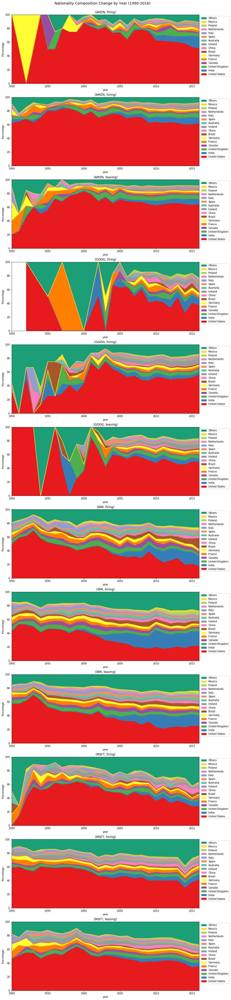

In [24]:
# Create a uniform colormap for all subplots.
cntry_ord_unif = empl_changes_df.groupby('cntry').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    cntry_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='cntry',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:28]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,rotatelabels=True,
#         color = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()


## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Nationality Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','cntry']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        cntry_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(cntry_ord_unif)}[x] for x in df.cntry
        ], count = 1
    ).pivot_table(
        index='year', columns='cntry_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [cntry_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(1990,2016),xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(labels), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Education Level.

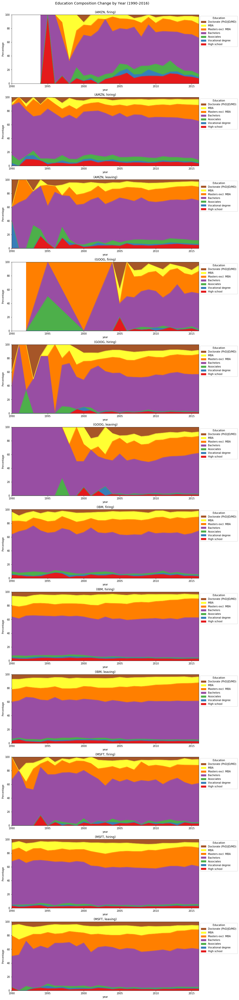

In [25]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}
colormap_unif = {str(idx):clr for idx, clr in zip(
    range(len(edu_lablst)),
    itertools.cycle([plt.get_cmap('Dark2').colors[0]]+list(plt.get_cmap('Set1').colors))
)}

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='edu',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[edu_lablst[x] for x in range(0,8)]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Education Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','edu']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.loc[lambda df:[int(x)>=f_none_hidden for x in df.edu]].assign(count = 1).pivot_table(
        index='year', columns='edu', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(1990,2016), xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), [edu_lablst[int(x)] for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title="Education"
    )
plt.show()



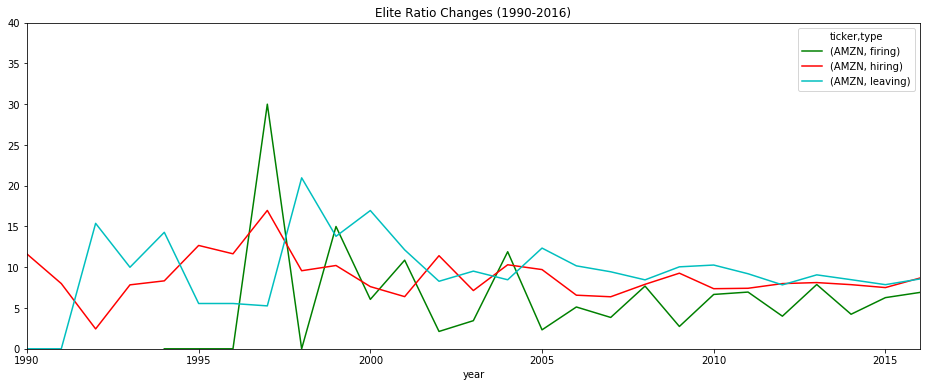

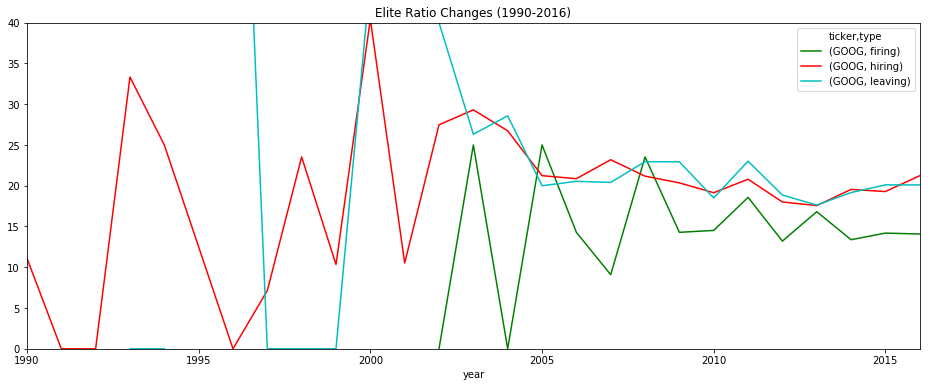

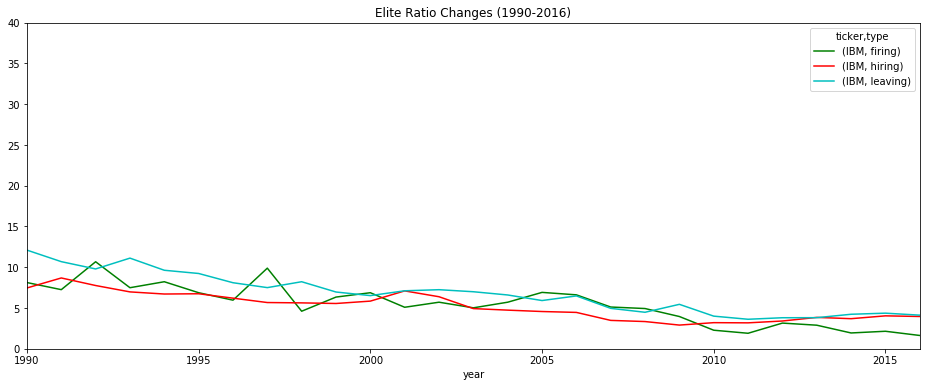

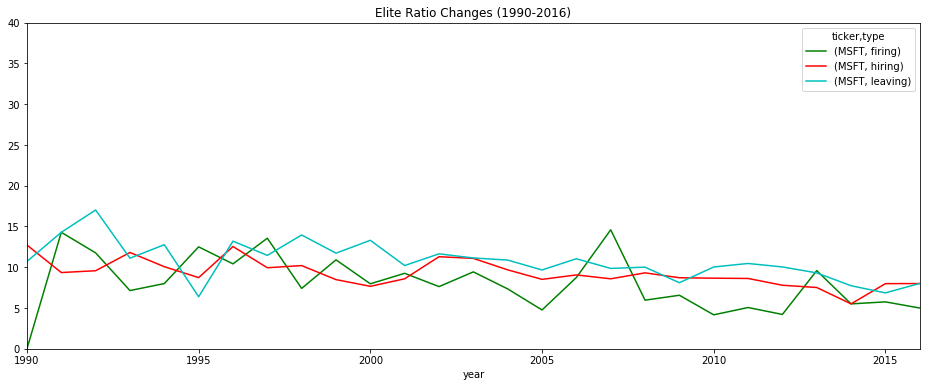

In [26]:
for ticker, grp in empl_changes_df.groupby('ticker'):
    grp.loc[lambda df:df.year>=1990].pivot_table(
        index='year',columns=['ticker','type'],values='f_elite',
        aggfunc=lambda x:((x=='True').sum()/(x==x).sum()*100)
    ).plot(
        xlim=(1990,2016),color=color_styles,ylim=(0,40),
        title="Elite Ratio Changes (1990-2016)",figsize=(16,6)
    )
    ax.set_ylabel('Percentage')
plt.show()

# By Next Industry.

Note: Division of 2-digit NAICS's into industry groups are obtained from [Bureau of Labor Statistics](https://www.bls.gov/iag/tgs/iag_index_naics.htm).

In [27]:
NAICS2GRP_dict = {
    '11': (1, "Natural Resources and Mining"),
    '21': (1, "Natural Resources and Mining"),
    '23': (2, "Construction"),
    '31': (3, "Manufacturing"),
    '32': (3, "Manufacturing"),
    '33': (3, "Manufacturing"),
    '42': (4, "Trade, Transportation, and Utilities"),
    '44': (4, "Trade, Transportation, and Utilities"),
    '45': (4, "Trade, Transportation, and Utilities"),
    '48': (4, "Trade, Transportation, and Utilities"),
    '49': (4, "Trade, Transportation, and Utilities"),
    '22': (4, "Trade, Transportation, and Utilities"),
    '51': (5, "Information"),
    '52': (6, "Financial Activities"),
    '53': (6, "Financial Activities"),
    '54': (7, "Professional and Business Services"),
    '55': (7, "Professional and Business Services"),
    '56': (7, "Professional and Business Services"),
    '61': (8, "Education and Health Services"),
    '62': (8, "Education and Health Services"),
    '71': (9, "Leisure and Hospitality"),
    '72': (9, "Leisure and Hospitality"),
    '81': (10, "Other Services"),
    '92': (11, "Public Administration"),
    '99': (12, "Unknown/Unclassified"),
    ''  : (12, "Unknown/Unclassified"),
    'MI': (12, "Unknown/Unclassified"),
    '46': (12, "Unknown/Unclassified")
}

# Show the mappings.
pd.DataFrame(
    [[key, value[0], value[1]] for key,value in NAICS2GRP_dict.items()]
).groupby([1,2])[0].apply(lambda ser:', '.join(ser)).reset_index().drop(1,axis=1).rename(
    {2:"Industry group",0:"NAICS2"},axis=1
)

,Industry group,NAICS2
0,Natural Resources and Mining,"11, 21"
1,Construction,23
2,Manufacturing,"31, 32, 33"
3,"Trade, Transportation, and Utilities","42, 44, 45, 48, 49, 22"
4,Information,51
5,Financial Activities,"52, 53"
6,Professional and Business Services,"54, 55, 56"
7,Education and Health Services,"61, 62"
8,Leisure and Hospitality,"71, 72"
9,Other Services,81


Note: `46` seems to be a wrong NAICS2 code.

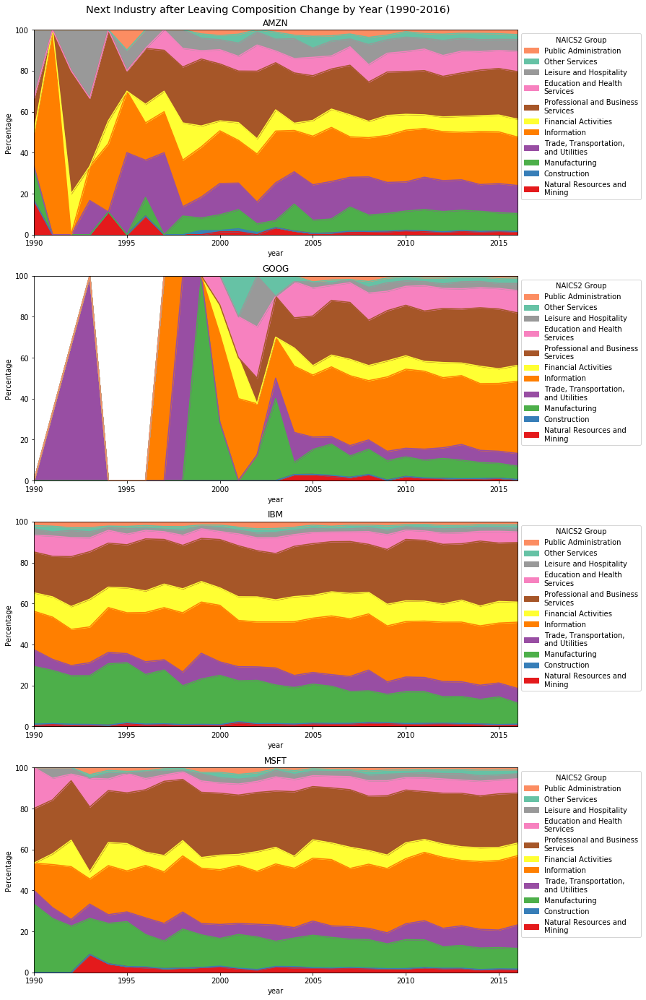

In [28]:
ind_next_lst = sorted(list(set(NAICS2GRP_dict.values())))
colormap_unif = {idx:clr for idx, clr in zip(
    ind_next_lst[:-1], # Assume the last element is "Others".
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif[ind_next_lst[-1]] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(1,2,figsize=(15,7.5))
# for (idx,col),ax in zip(empl_changes_df.loc[lambda df:df.type=='leaving'].pivot_table(
#     index=empl_changes_df.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
#     columns='ticker', values='gender', aggfunc='count'
# ).iteritems(),axs):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[x[1] for x in col.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
fig, axs = plt.subplots(4,1,figsize=(12,24))
fig.suptitle("Next Industry after Leaving Composition Change by Year (1990-2016)", fontsize='x-large', y=0.90)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(df.type=='leaving'), ['ticker','type','year','ind_next']
    ].groupby('ticker'), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        columns=grp.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
        index='year', values='count', aggfunc='sum', fill_value=0
    )
    if f_none_hidden:
        to_plot.drop(ind_next_lst[-1], axis=1, inplace=True)
    to_plot = to_plot.apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=idx, xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["\n".join(wrap(re.match(r"\(\d+, (.+)\)",x).group(1),25)) for x in reversed(labels)], 
        loc='upper left', bbox_to_anchor=(1,1), title="NAICS2 Group"
    )
plt.show()

## Tenure and Number of Promotions.

Note:
- Tenure = End date of last entry - Start date of first entry in a consecutive sequence of entries in the same company;
 - When there is any invalid month in the two dates and their years are _not_ the same, the invalid month is replaced by 6;
 - When there is any invalid month in the two dates and their years are the same, the invalid month is assumed to be the extreme value (0 for start and 12 for end) and the results are the minimum of their difference and 6.
- Number of promotions = Number of entries in a consecutive sequence of entries in the same company - 1.

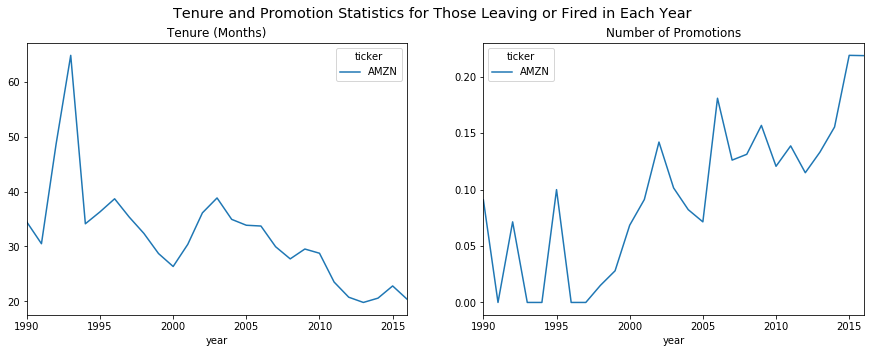

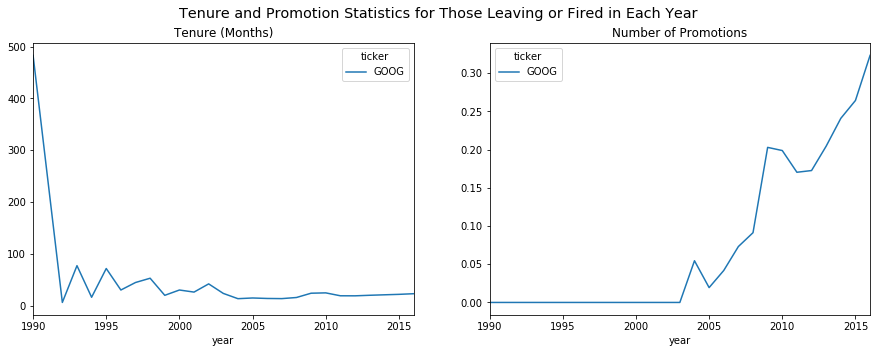

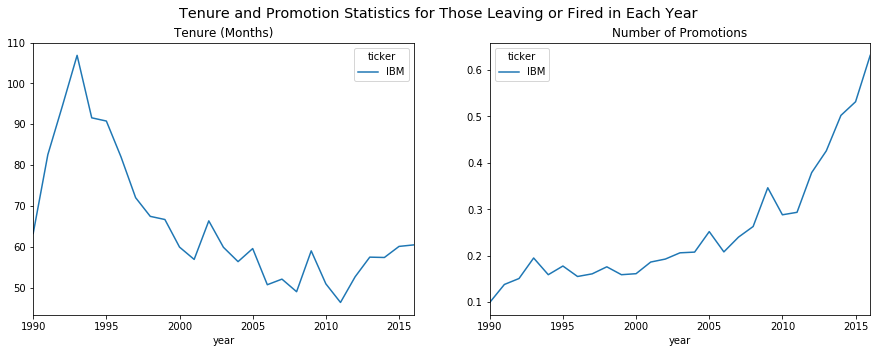

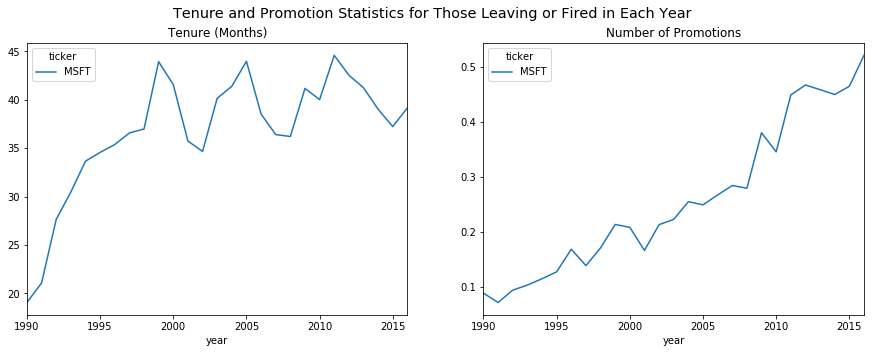

In [29]:
for ticker, grp in empl_changes_df.groupby('ticker'):
    # Calculate.
    to_plot = grp.loc[lambda df:(df.type!='hiring')&(df.year>=1990)&(df.year<=2016)].astype(
        {'tenure':'Int64','nprom':'Int64'}
    ).pivot_table(
        columns=['ticker'],index='year',values=['tenure','nprom'],aggfunc=np.nanmean
    )

    # Plot.
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15,5))
    fig.suptitle("Tenure and Promotion Statistics for Those Leaving or Fired in Each Year",fontsize='x-large')
    to_plot['tenure'].plot(
        title="Tenure (Months)",ax=ax1,xticks=[1990,1995,2000,2005,2010,2015],xlim=(1990,2016)
    )
    to_plot['nprom'].plot(
        title="Number of Promotions",ax=ax2,xticks=[1990,1995,2000,2005,2010,2015],xlim=(1990,2016)
    )
plt.show()